# K-nearest neighbour (KNN) Segmentation

In [1]:
import skimage.io as skio
import matplotlib.pyplot as plt
import numpy as np
from scipy import misc
from PIL import Image
from skimage.color import rgb2gray

In [2]:
im1= skio.imread("auto/im11.png")
im2= skio.imread("auto/im12.png")
im3= skio.imread("auto/im13.png")

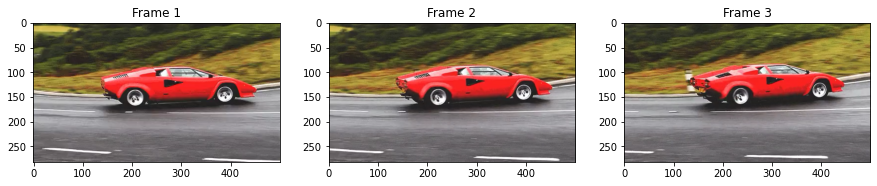

(282, 500, 3)

In [3]:
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1)
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2)
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3)
plt.show()
im1.shape

In [4]:
def imagen2vector(imagen1, imagen2, imagen3):
    v1=imagen1.flatten()
    v2=imagen2.flatten()
    v3=imagen3.flatten()
    img_vec = np.concatenate((v1, v2, v3), axis=0)
    img_vec=img_vec[:,np.newaxis]
    return img_vec

## Feature extraction

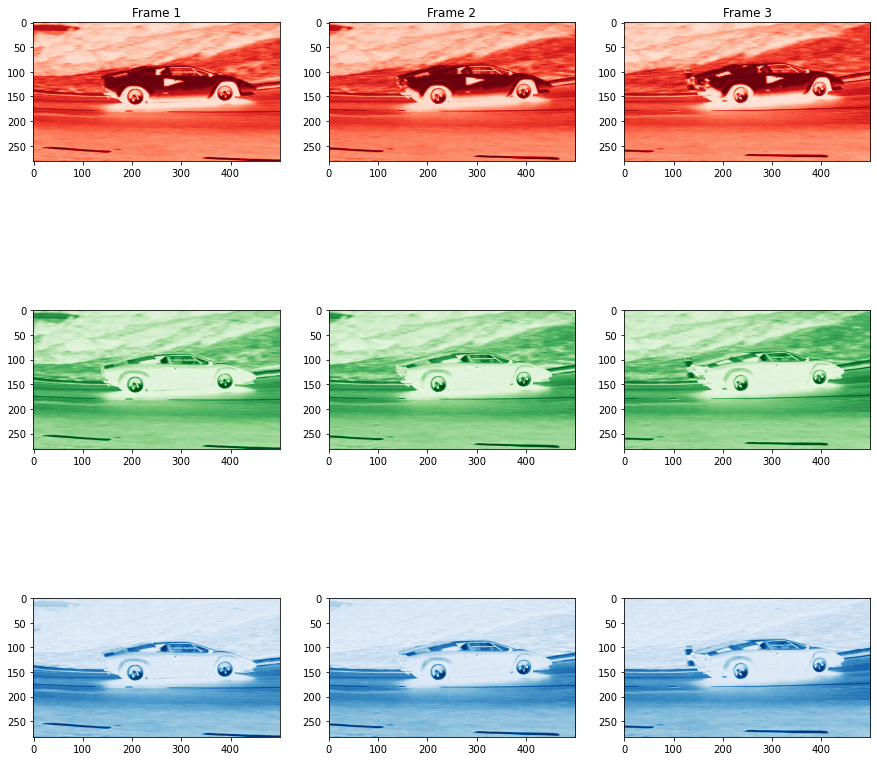

In [5]:

im1_r = im1[:, :, 0]
im1_g = im1[:, :, 1]
im1_b = im1[:, :, 2]
im2_r = im2[:, :, 0]
im2_g = im2[:, :, 1]
im2_b = im2[:, :, 2]
im3_r = im3[:, :, 0]
im3_g = im3[:, :, 1]
im3_b = im3[:, :, 2]

plt.figure(figsize=(15,15))
plt.subplot(3,3,1)
plt.title('Frame 1')
plt.imshow(im1_r, cmap='Reds')
plt.subplot(3,3,4)
plt.imshow(im1_g, cmap='Greens')
plt.subplot(3,3,7)
plt.imshow(im1_b, cmap='Blues')

plt.subplot(3,3,2)
plt.title('Frame 2')
plt.imshow(im2_r, cmap='Reds')
plt.subplot(3,3,5)
plt.imshow(im2_g, cmap='Greens')
plt.subplot(3,3,8)
plt.imshow(im2_b, cmap='Blues')

plt.subplot(3,3,3)
plt.title('Frame 3')
plt.imshow(im3_r, cmap='Reds')
plt.subplot(3,3,6)
plt.imshow(im3_g, cmap='Greens')
plt.subplot(3,3,9)
plt.imshow(im3_b, cmap='Blues')
plt.show()


im_r=imagen2vector(im1_r,im2_r,im3_r)
im_g=imagen2vector(im1_g,im2_g,im3_g)
im_b=imagen2vector(im1_b,im2_b,im3_b)

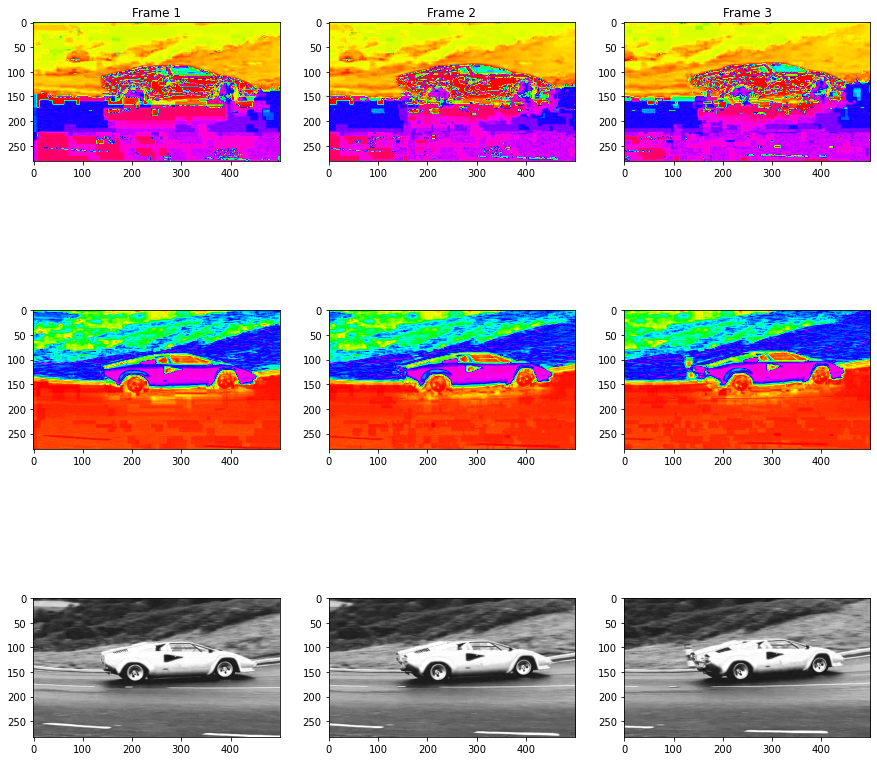

In [6]:
from skimage.color import rgb2hsv
hsv_img1 = rgb2hsv(im1)
hsv_img2 = rgb2hsv(im2)
hsv_img3 = rgb2hsv(im3)

hue_img1 = hsv_img1[:, :, 0]
sat_img1 = hsv_img1[:, :, 1]
value_img1 = hsv_img1[:, :, 2]

hue_img2 = hsv_img2[:, :, 0]
sat_img2 = hsv_img2[:, :, 1]
value_img2 = hsv_img2[:, :, 2]

hue_img3 = hsv_img3[:, :, 0]
sat_img3 = hsv_img3[:, :, 1]
value_img3 = hsv_img3[:, :, 2]



plt.figure(figsize=(15,15))
plt.subplot(3,3,1)
plt.title('Frame 1')
plt.imshow(hue_img1, cmap='hsv')
plt.subplot(3,3,4)
plt.imshow(sat_img1, cmap='hsv')
plt.subplot(3,3,7)
plt.imshow(value_img1, cmap='gray')

plt.subplot(3,3,2)
plt.title('Frame 2')
plt.imshow(hue_img2, cmap='hsv')
plt.subplot(3,3,5)
plt.imshow(sat_img2, cmap='hsv')
plt.subplot(3,3,8)
plt.imshow(value_img2, cmap='gray')

plt.subplot(3,3,3)
plt.title('Frame 3')
plt.imshow(hue_img3, cmap='hsv')
plt.subplot(3,3,6)
plt.imshow(sat_img3, cmap='hsv')
plt.subplot(3,3,9)
plt.imshow(value_img3, cmap='gray')
plt.show()


im_hue=imagen2vector(hue_img1,hue_img2,hue_img3)
im_sat=imagen2vector(sat_img1,sat_img2,sat_img3)
im_value=imagen2vector(value_img1,value_img1,value_img3)

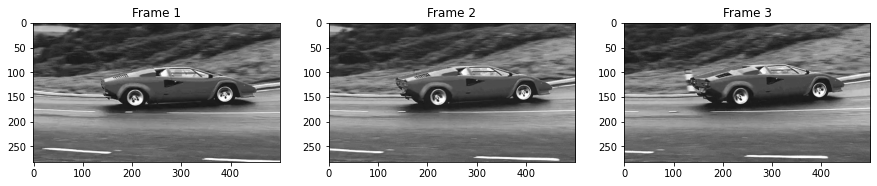

In [7]:
im1g = rgb2gray(im1)
im2g = rgb2gray(im2)
im3g = rgb2gray(im3)
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1g, cmap='gray')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2g, cmap='gray')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3g, cmap='gray')
plt.show()

im_gray=imagen2vector(im1g,im2g,im3g)

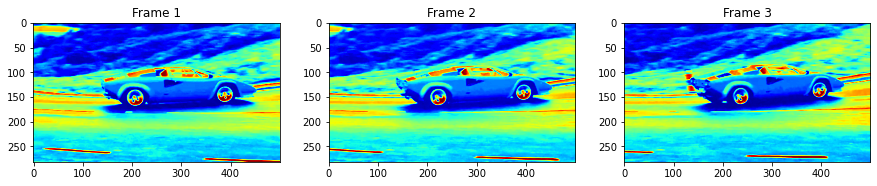

In [8]:
from skimage.morphology import disk
from skimage.filters import median
im1m = median(im1g)
im2m = median(im2g)
im3m = median(im3g)
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1m, cmap='jet')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2m, cmap='jet')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3m, cmap='jet')
plt.show()

im_median=imagen2vector(im1m,im2m,im3m)

/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


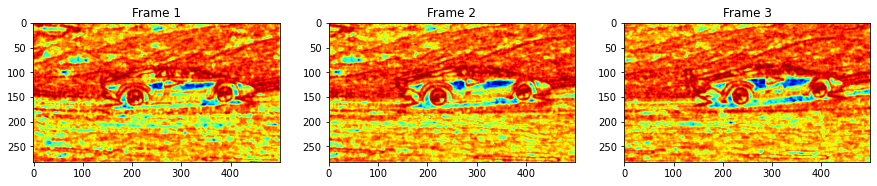

In [9]:
from skimage.filters.rank import entropy
im1e = entropy(im1g, disk(3))
im2e = entropy(im2g, disk(3))
im3e = entropy(im3g, disk(3))
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1e, cmap='jet')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2e, cmap='jet')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3e, cmap='jet')
plt.show()

im_entropy=imagen2vector(im1e,im2e,im3e)

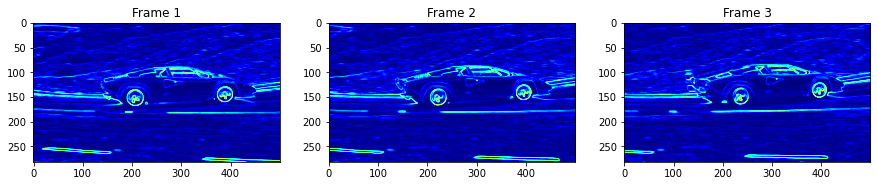

In [10]:
from skimage.filters import sobel

im1so = sobel(im1g)
im2so = sobel(im2g)
im3so = sobel(im3g)
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1so, cmap='jet')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2so, cmap='jet')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3so, cmap='jet')
plt.show()

im_sobel=imagen2vector(im1so,im2so,im3so)

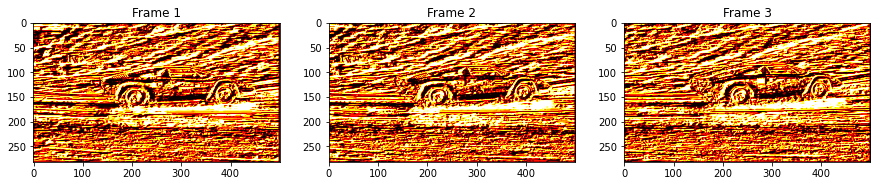

In [11]:
from skimage.feature import local_binary_pattern
radius = 3
n_points = 8 * radius
im1_lp = local_binary_pattern(im1g, n_points, radius)
im2_lp = local_binary_pattern(im2g, n_points, radius)
im3_lp = local_binary_pattern(im3g, n_points, radius)
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(im1_lp, cmap='hot')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(im2_lp, cmap='hot')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(im3_lp, cmap='hot')
plt.show()

im_local_bin=imagen2vector(im1_lp,im2_lp,im3_lp)

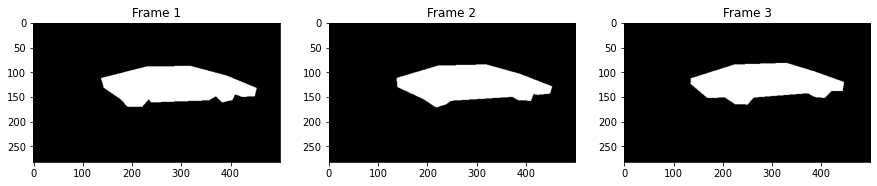

In [12]:
from sklearn.preprocessing import MinMaxScaler
label_im1= skio.imread("auto/seg11.png")
label_im2= skio.imread("auto/seg12.png")
label_im3= skio.imread("auto/seg13.png")

plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title('Frame 1')
plt.imshow(label_im1, cmap='gray')
plt.subplot(1,3,2)
plt.title('Frame 2')
plt.imshow(label_im2, cmap='gray')
plt.subplot(1,3,3)
plt.title('Frame 3')
plt.imshow(label_im3, cmap='gray')
plt.show()

im_label=imagen2vector(label_im1,label_im2,label_im3)
im_label = MinMaxScaler().fit_transform(im_label)

In [13]:
# Ordenamiento de los datos
import pandas as pd
data=np.concatenate([im_r, im_g, im_b,im_hue, im_sat, im_value, im_gray,im_median,im_entropy,im_sobel,im_local_bin,im_label], axis = 1)
df = pd.DataFrame(data, columns=["Rojo", "Verde","Azul","Hue", "Saturation","Valor", "Grices","Mediana","Entropia","Sobel","Patrones_locales","Labels"])

df

,Rojo,Verde,Azul,Hue,Saturation,Valor,Grices,Mediana,Entropia,Sobel,Patrones_locales,Labels
0,101.0,99.0,72.0,0.155172,0.287129,0.396078,0.382268,0.382268,3.459432,0.069689,1.0,0.0
1,105.0,102.0,76.0,0.149425,0.276190,0.411765,0.395149,0.382268,3.807355,0.076497,1.0,0.0
2,110.0,107.0,81.0,0.149425,0.263636,0.431373,0.414756,0.395149,4.087463,0.083973,1.0,0.0
3,114.0,112.0,85.0,0.155172,0.254386,0.447059,0.433248,0.414756,4.169925,0.095359,1.0,0.0
4,122.0,120.0,93.0,0.155172,0.237705,0.478431,0.464621,0.433248,4.058814,0.106739,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
422995,90.0,87.0,90.0,0.833333,0.033333,0.352941,0.344525,0.344525,2.572431,0.008611,8162.0,0.0
422996,90.0,87.0,90.0,0.833333,0.033333,0.352941,0.344525,0.344525,2.794653,0.007730,8160.0,0.0
422997,90.0,87.0,90.0,0.833333,0.033333,0.352941,0.344525,0.344525,2.698660,0.007938,8160.0,0.0
422998,89.0,86.0,89.0,0.833333,0.033708,0.349020,0.340603,0.344525,2.753434,0.006807,7648.0,0.0


In [14]:
# Número de clases
print(df.groupby('Labels').size())

Labels
0.0    370530
1.0     52470
dtype: int64


In [15]:
# Seleccion de variables

variables=["Rojo","Saturation","Mediana"]

#variables=["Rojo"]
X=df.loc[:,variables] # Conjunto de entramiento

array = df.values
#X=array[:,0:-1]
y=array[:,-1] # Etiquetas
names=df.columns[0:-1]

In [16]:
# Particion de datos para validacion
from sklearn.model_selection import train_test_split
X_entrenamiento,X_test,Y_entrenamiento,Y_test=train_test_split(X,y,test_size=30,
                                                    random_state=50)


## Clasification learning

In [17]:
from sklearn.neighbors import KNeighborsClassifier
clf= KNeighborsClassifier(n_neighbors=60, n_jobs=-1) #K=50?? (vecinos)
clf.fit(X_entrenamiento, Y_entrenamiento)

KNeighborsClassifier(n_jobs=-1, n_neighbors=60)

## Validation

In [18]:
from sklearn.model_selection import cross_val_score
print ('Accuracy:')
print((clf.score(X_test,Y_test))*100)

Accuracy:
96.66666666666667


In [19]:
Y_pred=clf.predict(X_test)
Y_predn=Y_pred[:,np.newaxis]
Y_testn=Y_test[:,np.newaxis]
resultados=np.concatenate([Y_predn, Y_testn], axis = 1)
resul = pd.DataFrame(resultados, columns=["Predicciones", "Reales"])
resul

,Predicciones,Reales
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
5,0.0,0.0
6,0.0,0.0
7,0.0,0.0
8,0.0,0.0
9,0.0,0.0


## Use

In [20]:
def imagen2vector_test(imagen1):
    v1=imagen1.flatten()
    img_vec=v1[:,np.newaxis]
    return img_vec

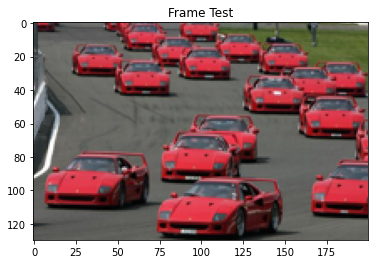

/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [21]:
im_test= Image.open("auto/otra.jpeg") # otra.jpeg
im_test = np.array(im_test.resize((200, 130)))
# Despliegue
plt.title('Frame Test')
plt.imshow(im_test)
plt.show()

# RGB components
im_r = imagen2vector_test(im_test[:, :, 0])
im_g = imagen2vector_test(im_test[:, :, 1])
im_b = imagen2vector_test(im_test[:, :, 2])

# HSV componets
hsv_test = rgb2hsv(im_test)
hue_test = imagen2vector_test(hsv_test[:, :, 0])
sat_test = imagen2vector_test(hsv_test[:, :, 1])
value_test = imagen2vector_test(hsv_test[:, :, 2])


# Gray
img_test = imagen2vector_test(rgb2gray(im_test))

# Mediana
imm = imagen2vector_test(median(img_test, disk(5)))

# Entropia
ime = imagen2vector_test(entropy(img_test, disk(9)))

# Sobel
imso = imagen2vector_test(sobel(img_test))

# Patrones locales binarios
radius = 3
n_points = 8 * radius
imlp = imagen2vector_test(local_binary_pattern(img_test, n_points, radius))

In [22]:
ima_concatenada=np.concatenate([im_r, im_g, im_b, hue_test, sat_test, value_test, img_test, imm,ime,imso,imlp], axis = 1)
df_test = pd.DataFrame(ima_concatenada, columns=["Rojo", "Verde","Azul","Hue", "Saturation","Valor", "Grices","Mediana","Entropia","Sobel","Patrones_locales"])

# Seleccion de variables
ima_test=df_test.loc[:,variables]

In [23]:
df_test

,Rojo,Verde,Azul,Hue,Saturation,Valor,Grices,Mediana,Entropia,Sobel,Patrones_locales
0,58.0,78.0,81.0,0.521739,0.283951,0.317647,0.290064,0.290064,3.121928,0.035464,262144.0
1,45.0,66.0,61.0,0.460317,0.318182,0.258824,0.239910,0.290064,3.277613,0.033779,262144.0
2,94.0,53.0,54.0,0.995935,0.436170,0.368627,0.242293,0.290064,3.418296,0.112587,262144.0
3,203.0,73.0,89.0,0.979487,0.640394,0.796078,0.399132,0.341473,3.546594,0.070131,0.0
4,215.0,51.0,68.0,0.982724,0.762791,0.843137,0.341473,0.345923,3.664498,0.036419,262144.0
...,...,...,...,...,...,...,...,...,...,...,...
25995,100.0,101.0,95.0,0.194444,0.059406,0.396078,0.393549,0.393549,2.610577,0.011092,262144.0
25996,101.0,102.0,96.0,0.194444,0.058824,0.400000,0.397470,0.397470,2.565448,0.008319,262144.0
25997,103.0,104.0,98.0,0.194444,0.057692,0.407843,0.405313,0.405313,2.625815,0.014065,0.0
25998,106.0,107.0,102.0,0.200000,0.046729,0.419608,0.417361,0.405596,2.663533,0.000200,0.0


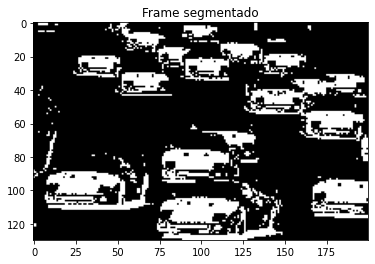

In [24]:
ima_segmetada=clf.predict(ima_test)

ima_segmetada=ima_segmetada.reshape(130, 200)
# Despliegue
plt.title('Frame segmentado')
plt.imshow(ima_segmetada, cmap='gray')
plt.show()

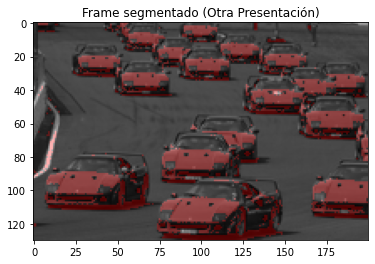

In [25]:
from skimage.measure import label, regionprops
from skimage.color import label2rgb
image_label = label2rgb(ima_segmetada, image=im_test, bg_label=0)
# Despliegue
plt.title('Frame segmentado (Otra Presentación)')
plt.imshow(image_label)
plt.show()

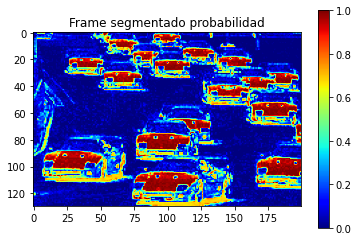

In [26]:
ima_segmetada_pro=clf.predict_proba(ima_test)
ima_segmetada_pro=ima_segmetada_pro[:,1]

ima_segmetada_pro=ima_segmetada_pro.reshape(130, 200)
# Despliegue
plt.title('Frame segmentado probabilidad')
plt.imshow(ima_segmetada_pro, cmap='jet')
plt.colorbar()
plt.show()

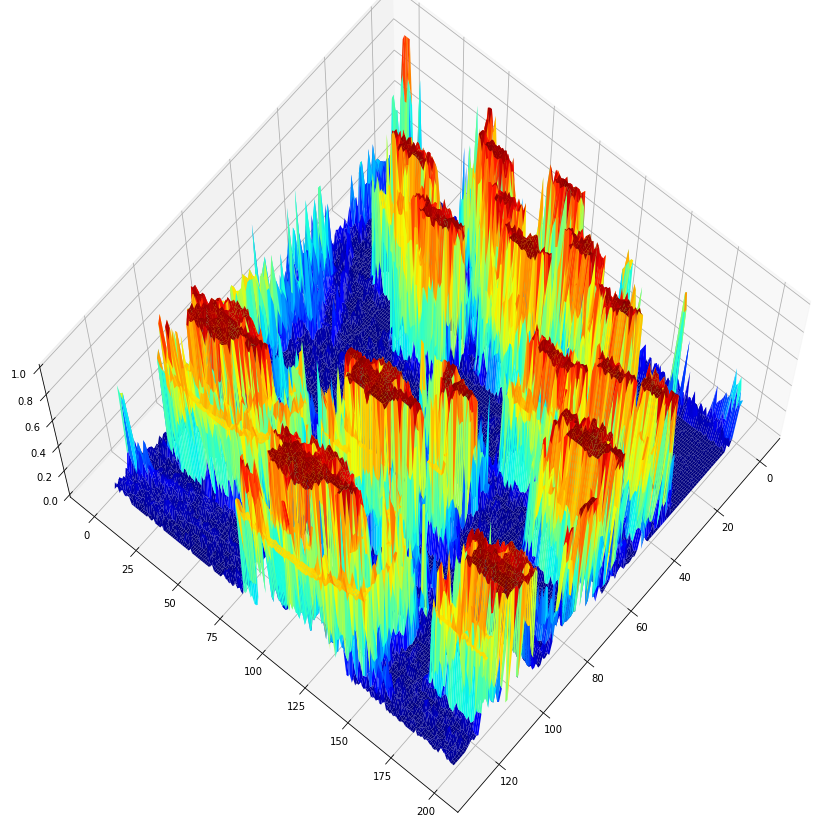

In [27]:
from mpl_toolkits.mplot3d import Axes3D
xx, yy = np.mgrid[0:ima_segmetada_pro.shape[0], 0:ima_segmetada_pro.shape[1]]

fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, ima_segmetada_pro,rstride=1, cstride=1, cmap=plt.cm.jet,
                linewidth=0)

ax.view_init(70, 40)
plt.show()



/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


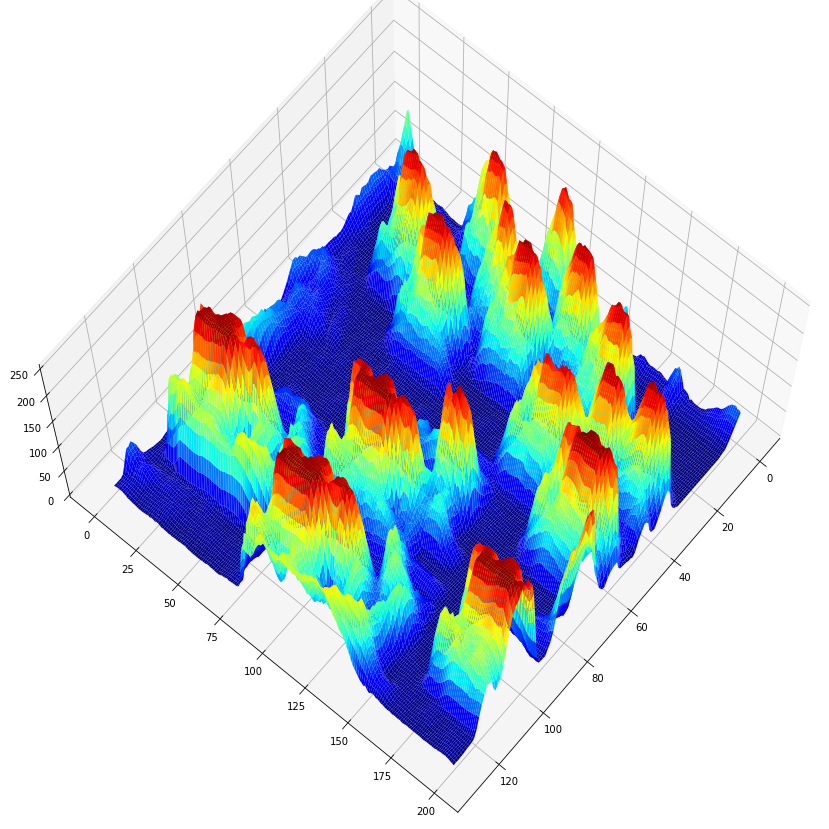

In [28]:
from skimage.filters.rank import mean

ima_segmetada_pro = mean(ima_segmetada_pro, disk(3))

xx, yy = np.mgrid[0:ima_segmetada_pro.shape[0], 0:ima_segmetada_pro.shape[1]]

fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, ima_segmetada_pro,rstride=1, cstride=1, cmap=plt.cm.jet,
                linewidth=0)

ax.view_init(70, 40)
plt.show()


## Car video segmentation

In [29]:
import cv2
from IPython import display
from skimage.measure import label, regionprops

In [30]:
# read images secuence
carImages = []
for i in range(11,36):
    carIm = Image.open("auto/im"+str(i)+".png")
    carImages.append(np.array(carIm.resize((250, 140))))
    

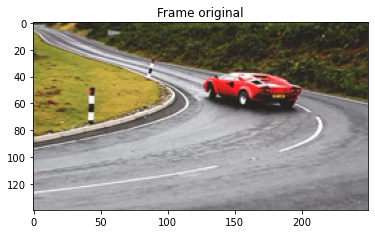

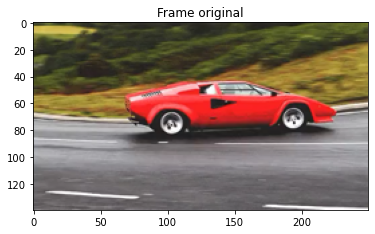

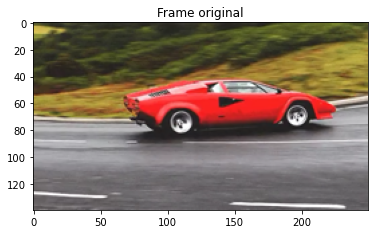

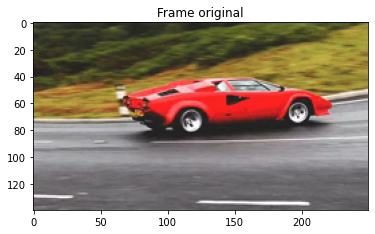

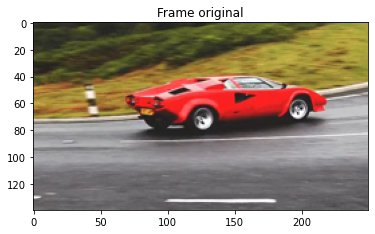

...

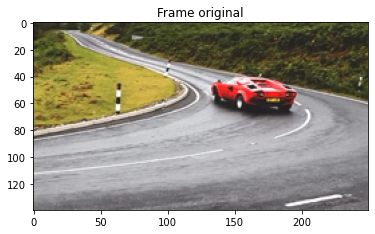

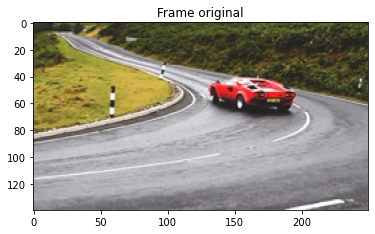

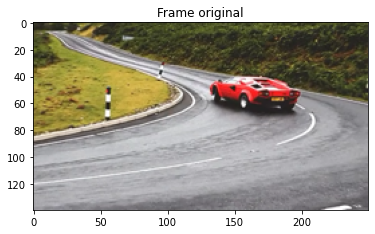

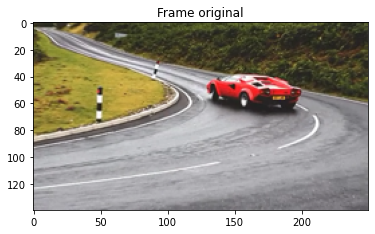

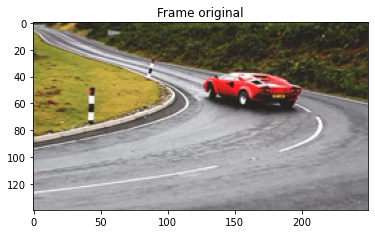

In [31]:
# show original sequence
for ima in carImages:
    plt.figure()
    plt.title('Frame original')
    plt.imshow(ima,cmap='gray')
    display.clear_output(wait=True)
    display.display(plt.gcf())

In [36]:
# segmentate secuence
carSeg = []
# feature extraction
for ima in carImages:
    # RGB components
    im_r = imagen2vector_test(ima[:, :, 0])
    im_g = imagen2vector_test(ima[:, :, 1])
    im_b = imagen2vector_test(ima[:, :, 2])
    # HSV componets
    hsvCar = rgb2hsv(ima)
    hue = imagen2vector_test(hsvCar[:, :, 0])
    sat = imagen2vector_test(hsvCar[:, :, 1])
    value = imagen2vector_test(hsvCar[:, :, 2])
    # Gray
    img = imagen2vector_test(rgb2gray(ima))
    # Mediana
    imm = imagen2vector_test(median(img, disk(5)))
    # Entropia
    ime = imagen2vector_test(entropy(img, disk(9)))
    # Sobel
    imso = imagen2vector_test(sobel(img))
    # Patrones locales binarios
    radius = 3
    n_points = 8 * radius
    imlp = imagen2vector_test(local_binary_pattern(img,n_points,radius))
    
    ima_concatenada=np.concatenate([im_r,im_g,im_b,hue,sat,value,img, imm,ime,imso,imlp], axis = 1)
    dfCar = pd.DataFrame(ima_concatenada, columns=["Rojo", "Verde","Azul","Hue", "Saturation","Valor", "Grices","Mediana","Entropia","Sobel","Patrones_locales"])
    # Seleccion de variables
    imaFeat=dfCar.loc[:,variables]
    
    ima_seg=clf.predict(imaFeat)
    carSeg.append(ima_seg.reshape(140,250))

/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/bandala/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/bandala/anaconda3/l

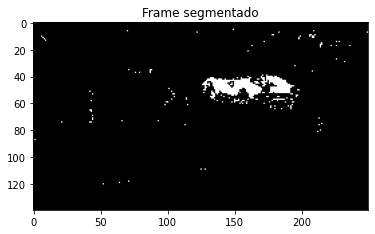

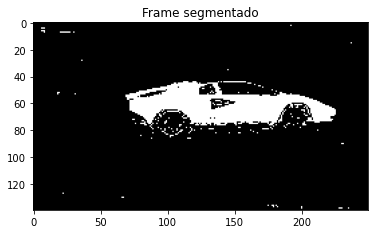

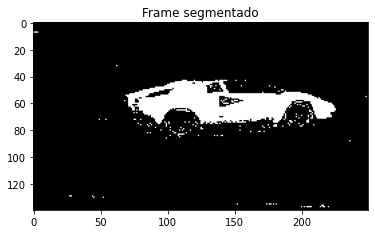

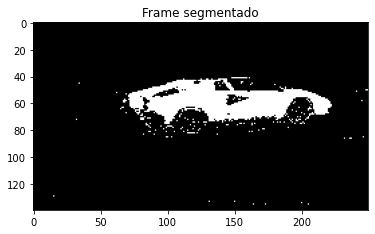

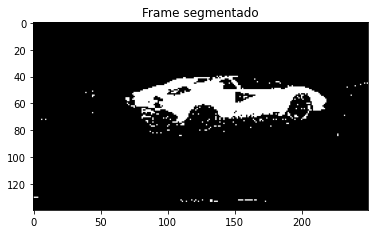

...

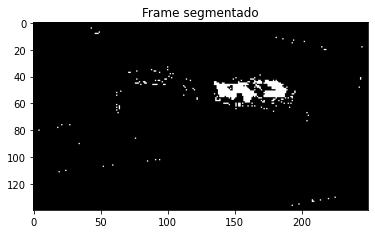

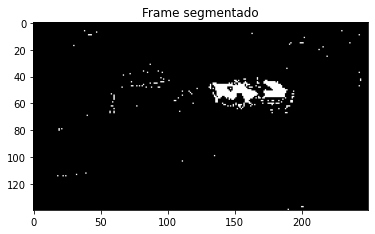

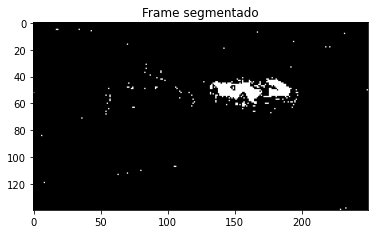

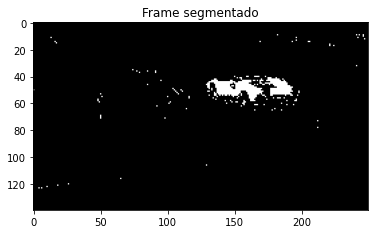

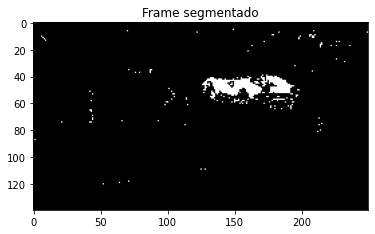

In [37]:
# segmentation by model
for seg in carSeg:
    plt.figure()
    plt.title('Frame segmentado')
    plt.imshow(seg,cmap='gray')
    display.clear_output(wait=True)
    display.display(plt.gcf())

In [38]:
# generate bounding box frames
bBoxes = []
for seg in carSeg:
    lbl = label(seg) 
    props = regionprops(lbl)
    box = seg.copy()
    max_width = 0
    maxBox = props[0].bbox
    for prop in props:
        actualWidth = prop.bbox[3]-prop.bbox[1]
        if (actualWidth>max_width):
            max_width = actualWidth
            maxBox = prop.bbox
    cv2.rectangle(box, (maxBox[1], maxBox[0]), (maxBox[3], maxBox[2]), (255, 0, 0), 1)
    bBoxes.append(box)

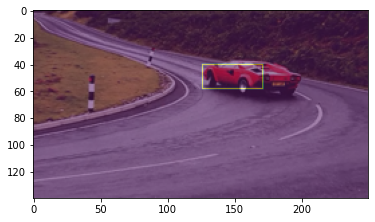

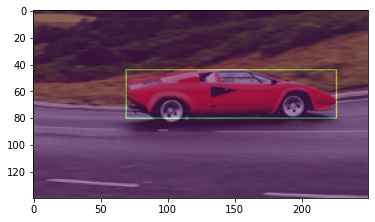

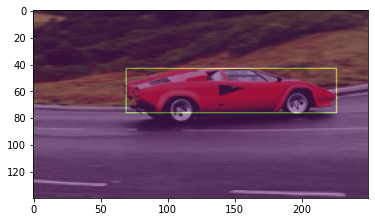

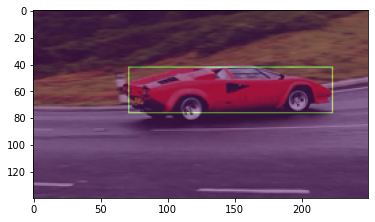

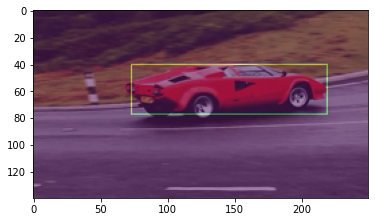

...

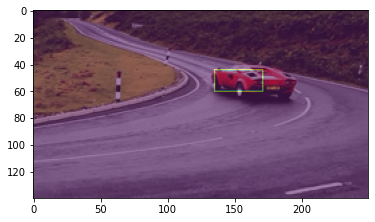

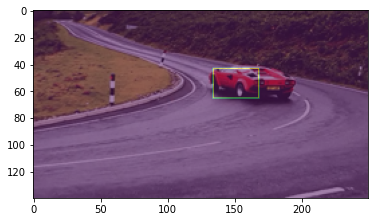

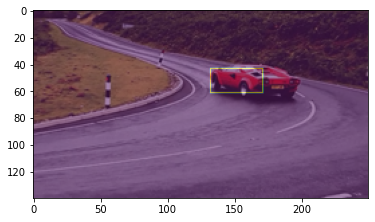

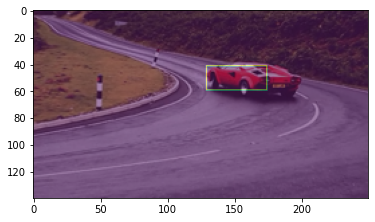

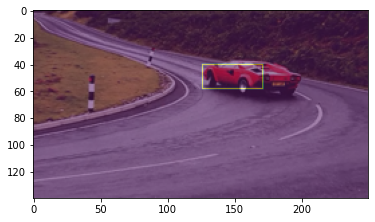

In [39]:
# show segmentation animation
for i in range(len(carImages)):
    plt.figure()
    plt.imshow(carImages[i])
    plt.imshow(bBoxes[i], alpha=0.5)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    